# Text To Image Generation

In [ ]:
!pip install --upgrade diffusers transformers -q

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.4/44.4 kB 1.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.7/9.7 MB 52.5 MB/s eta 0:00:00


In [2]:
!pip install diffusers transformers accelerate safetensors

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 106.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 85.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 58.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 17.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 6.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 85.9 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstalling nvidia-nvjitlink-cu12-12.5.82:
      Successfully uninstalled nvidia-nvjitli

In [3]:
import torch
from diffusers import StableDiffusionPipeline
from PIL import Image

The cache for model files in Transformers v4.22.0 has been updated. Migrating your old cache. This is a one-time only operation. You can interrupt this and resume the migration later on by calling `transformers.utils.move_cache()`.


0it [00:00, ?it/s]

In [4]:
model_id = "runwayml/stable-diffusion-v1-5"
pipe = StableDiffusionPipeline.from_pretrained(model_id, torch_dtype=torch.float16)
pipe = pipe.to("cuda")

/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


model_index.json:   0%|          | 0.00/541 [00:00<?, ?B/s]

Fetching 15 files:   0%|          | 0/15 [00:00<?, ?it/s]

model.safetensors:   0%|          | 0.00/1.22G [00:00<?, ?B/s]

scheduler/scheduler_config.json:   0%|          | 0.00/308 [00:00<?, ?B/s]

tokenizer/merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

safety_checker/config.json:   0%|          | 0.00/4.72k [00:00<?, ?B/s]

text_encoder/config.json:   0%|          | 0.00/617 [00:00<?, ?B/s]

tokenizer/special_tokens_map.json:   0%|          | 0.00/472 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/492M [00:00<?, ?B/s]

(…)ature_extractor/preprocessor_config.json:   0%|          | 0.00/342 [00:00<?, ?B/s]

tokenizer/tokenizer_config.json:   0%|          | 0.00/806 [00:00<?, ?B/s]

tokenizer/vocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/3.44G [00:00<?, ?B/s]

unet/config.json:   0%|          | 0.00/743 [00:00<?, ?B/s]

vae/config.json:   0%|          | 0.00/547 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

In [5]:
def generate_image_from_text(prompt, num_images=1, guidance_scale=7.5, num_inference_steps=50):
    with torch.autocast("cuda"):
        images = pipe(prompt, num_images_per_prompt=num_images, guidance_scale=guidance_scale, num_inference_steps=num_inference_steps).images
    return images

In [8]:
prompt = "A friendly alien with big, curious eyes, standing in a lush alien jungle with glowing plants."
generated_images = generate_image_from_text(prompt)

  0%|          | 0/50 [00:00<?, ?it/s]

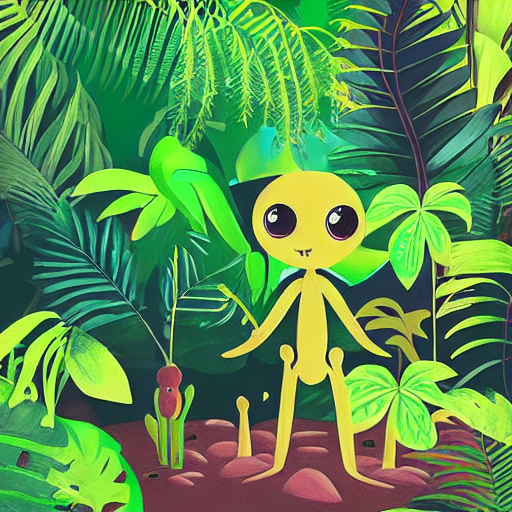

In [9]:
for img in generated_images:
    display(img)

  0%|          | 0/50 [00:00<?, ?it/s]

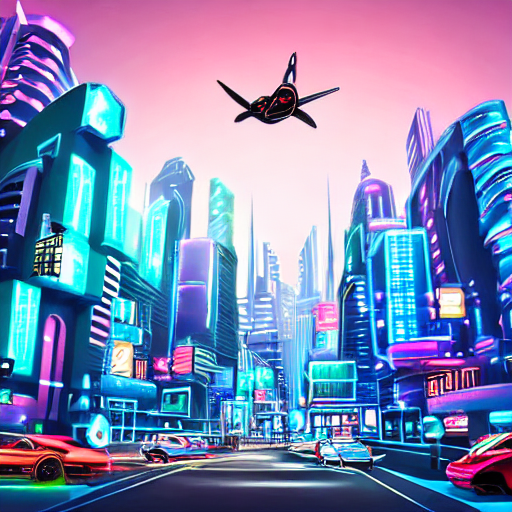

In [10]:
prompt = "A futuristic cityscape with flying cars and neon lights"
generated_images = generate_image_from_text(prompt)
for img in generated_images:
    display(img)

  0%|          | 0/50 [00:00<?, ?it/s]

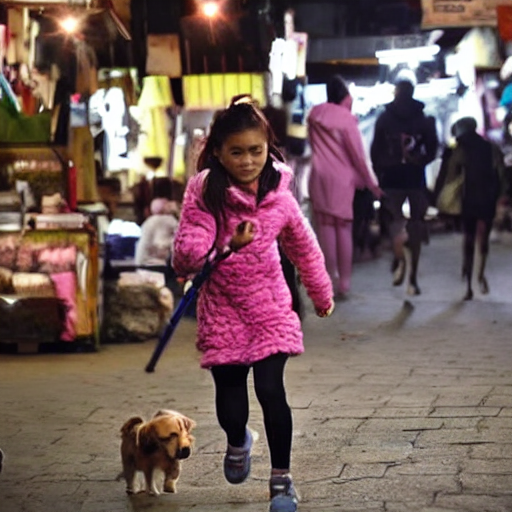

In [11]:
prompt = "A Girl With One Pen Dog In Night They Are Running In City Market."
generated_images = generate_image_from_text(prompt)
for img in generated_images:
    display(img)

  0%|          | 0/50 [00:00<?, ?it/s]

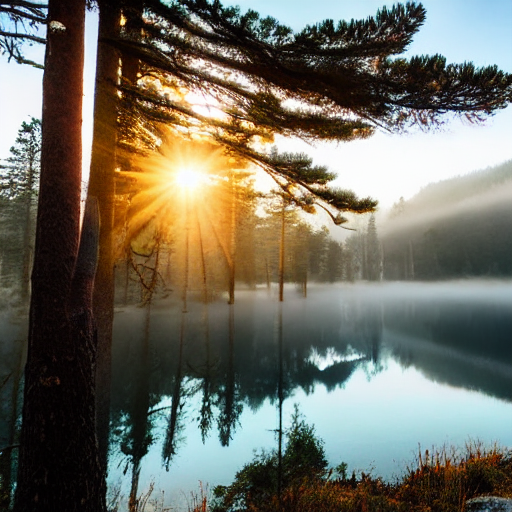

In [15]:
prompt = "A serene mountain lake at sunrise, surrounded by pine trees, with mist rising from the water."
generated_images = generate_image_from_text(prompt)
for img in generated_images:
    display(img)

  0%|          | 0/50 [00:00<?, ?it/s]

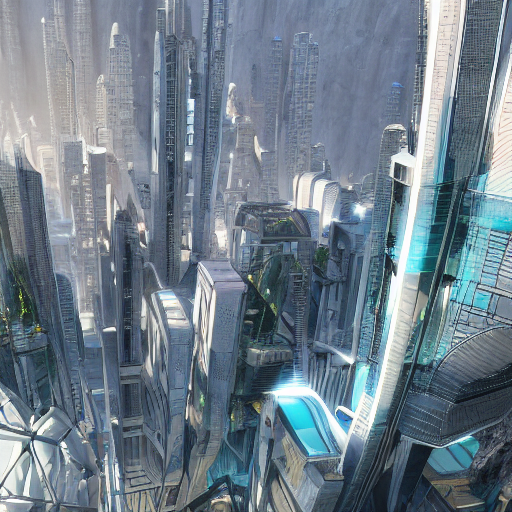

In [16]:
prompt = "A futuristic city built into a canyon, with bridges connecting towering skyscrapers."
generated_images = generate_image_from_text(prompt)
for img in generated_images:
    display(img)

  0%|          | 0/50 [00:00<?, ?it/s]

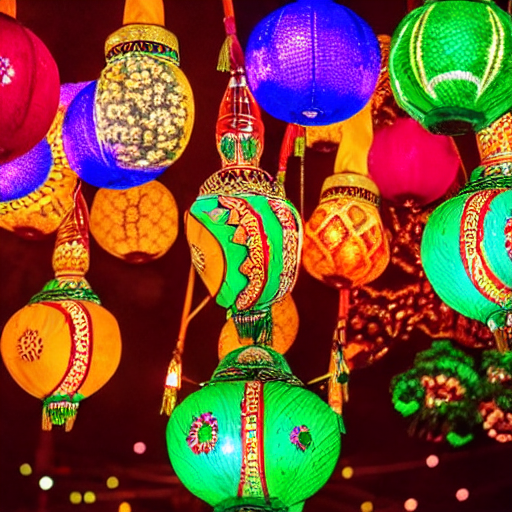

In [17]:
prompt = "A festive Diwali celebration with colorful lanterns, fireworks, and rangoli designs."
generated_images = generate_image_from_text(prompt)
for img in generated_images:
    display(img)

  0%|          | 0/50 [00:00<?, ?it/s]

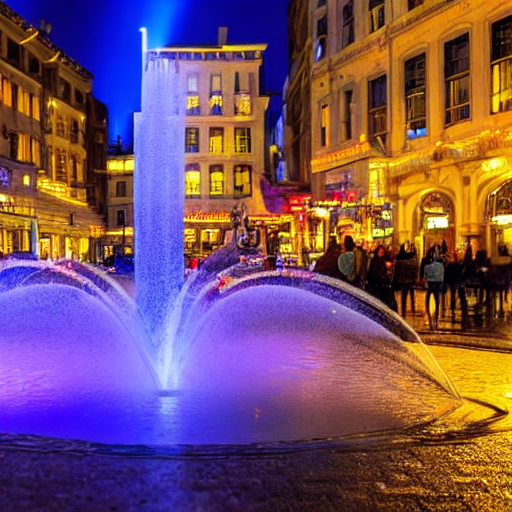

In [18]:
prompt = "A stunning fountain at the center of a vibrant city square, glowing with golden lights under the night sky. Vehicles drive by on the surrounding roads, their headlights creating streaks of light. People walk along the pathways, some admiring the fountain while others explore nearby shops with warmly lit windows. The scene is lively yet peaceful, capturing the essence of a bustling urban night."
generated_images = generate_image_from_text(prompt)
for img in generated_images:
    display(img)

  0%|          | 0/50 [00:00<?, ?it/s]

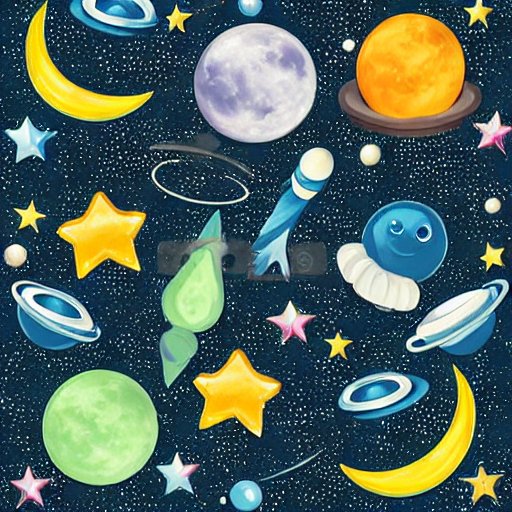

In [19]:
prompt = "Universe and alien and space , roket , stars, moon"
generated_images = generate_image_from_text(prompt)
for img in generated_images:
    display(img)

  0%|          | 0/50 [00:00<?, ?it/s]

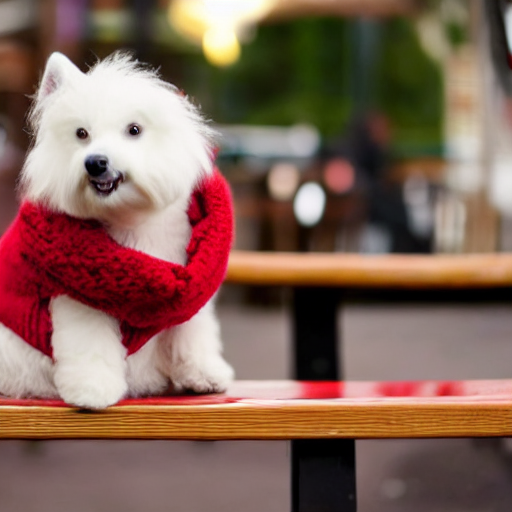

In [25]:
prompt = "A small, fluffy white dog wearing a tiny red cap, sitting on a wooden bench in a cozy cafe."
generated_images = generate_image_from_text(prompt)
for img in generated_images:
    display(img)

  0%|          | 0/50 [00:00<?, ?it/s]

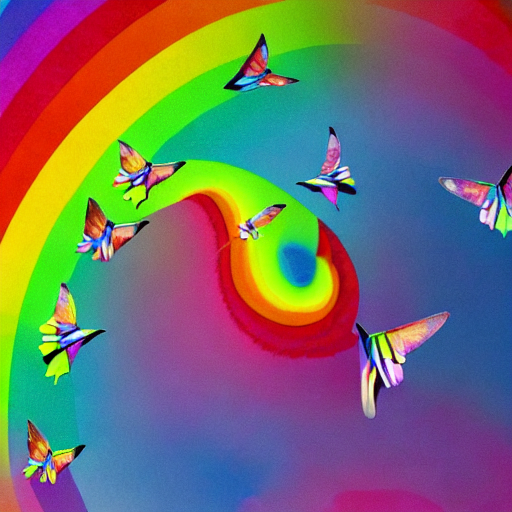

In [27]:
prompt = "A swarm of colorful butterflies forming a spiral in the sky, with a rainbow in the background."
generated_images = generate_image_from_text(prompt)
for img in generated_images:
    display(img)

  0%|          | 0/50 [00:00<?, ?it/s]

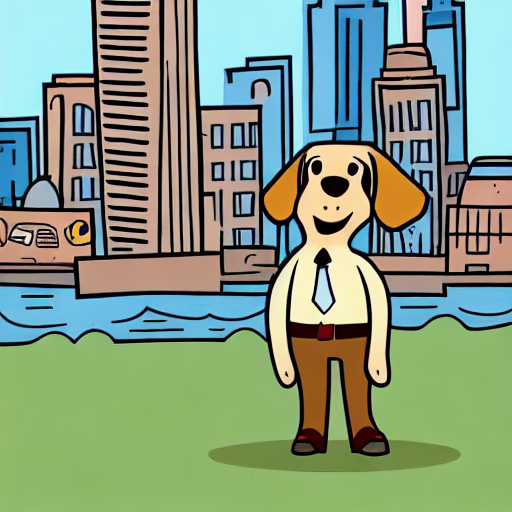

In [30]:
prompt = "A cartoon beagle detective searching for clues in a city."
generated_images = generate_image_from_text(prompt)
for img in generated_images:
    display(img)

  0%|          | 0/50 [00:00<?, ?it/s]

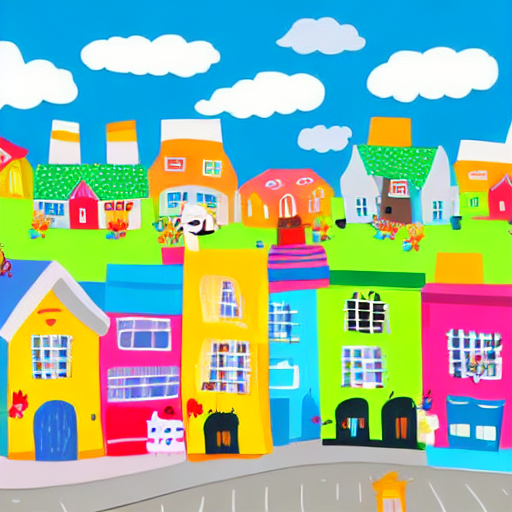

In [32]:
prompt = "A colorful cartoon scene of a happy town with smiling animals, people and cozy houses under a bright blue sky. "
generated_images = generate_image_from_text(prompt)
for img in generated_images:
    display(img)

  0%|          | 0/50 [00:00<?, ?it/s]

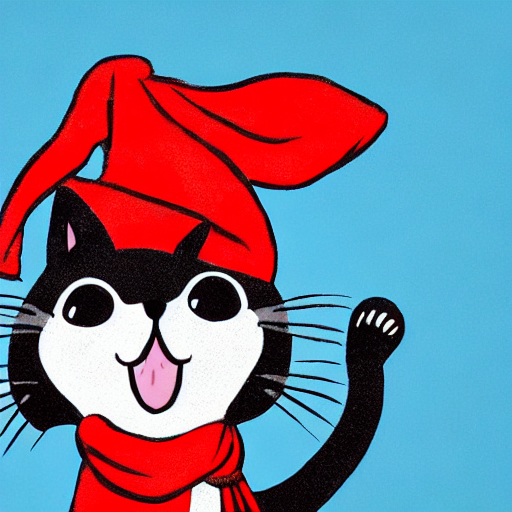

In [33]:
prompt = "A cute cartoon cat with big eyes, a red hat, and a blue scarf, waving happily in a bright,suny background."
generated_images = generate_image_from_text(prompt)
for img in generated_images:
    display(img)

  0%|          | 0/50 [00:00<?, ?it/s]

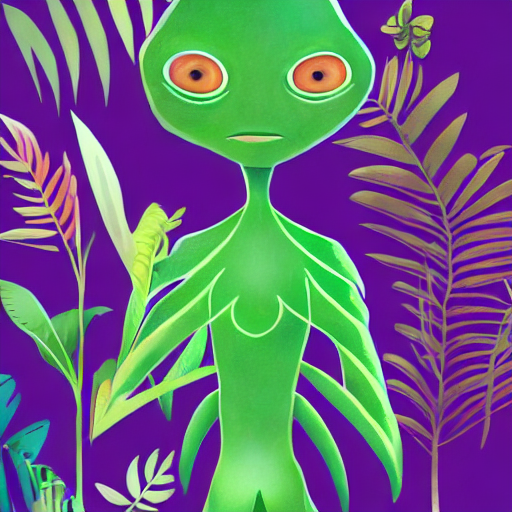

In [35]:
prompt = "A alien with big, curious eyes, standing in a lush alien jungle with glowing plants."
generated_images = generate_image_from_text(prompt)
for img in generated_images:
    display(img)

  0%|          | 0/50 [00:00<?, ?it/s]

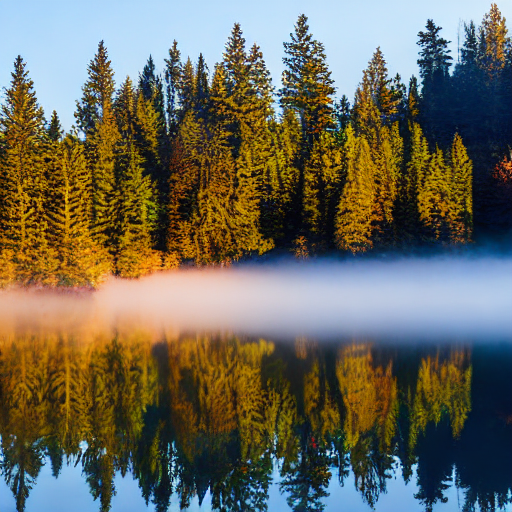

In [37]:
prompt = "A serene mountain lake at sunrise, surrounded by pine trees, with mist rising from the water."
generated_images = generate_image_from_text(prompt)
for img in generated_images:
    display(img)

  0%|          | 0/50 [00:00<?, ?it/s]

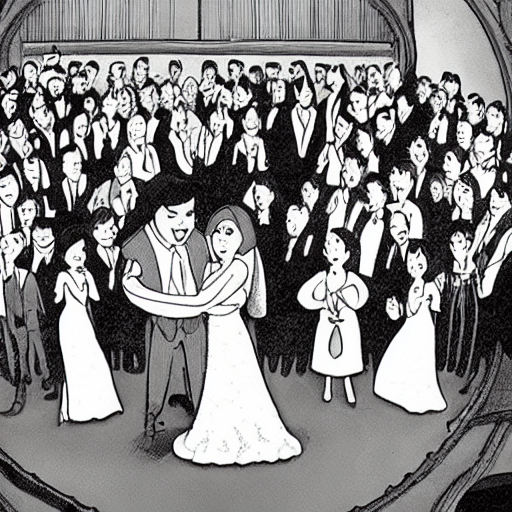

In [43]:
prompt = "the animated marriage celebration."
generated_images = generate_image_from_text(prompt)
for img in generated_images:
    display(img)